# SAAVY Final Code for Manuscript

In [1]:
# importing relevant libraries

# general math, stats, and data frame management
import numpy as np
import pandas as pd
import math
import scipy as sp
from scipy import special
from scipy import stats
from scipy.stats import shapiro
from scipy.stats import ttest_rel
from scipy.stats import wilcoxon
import krippendorff
import pingouin as pg

# plotting libraries
import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns

# confusion matrix analysis
from sklearn import metrics

# export functions
import dataframe_image as dfi

#### Functions that end up being called throughout the rest of the analysis

In [10]:
''' 
Creating a function that:
1. discretizes the data 
2. calculates the jsd values for distributions
3. organizes a dataframe for export of the data to a table

--------

The parameters are as follows:
comb_list: an initialized, empty list of 2 lists
data = a list of data sets
    data[0] = the first dataframe we are pulling information from
    data[1] = the second dataframe that we are pulling data from (if relevant, not always)
bins = the number of bins used to discretize the data
cols = a list of column names 
    col[0] = column name that we are interested in beginning the analysis on
    col[1] = column name that is the last in the iteration (will +1 for index requirements)
    col[2] = column that starts the iteration 
        if more than one data set!
inputs = a list of inputs for titling the resulting table export
    input[0] = column name for JSD group comparison 1
    input[1] = row title for the first data set I am looking at
    input[2] = row title for the second data set that I am looking at
    inout[3] = the name of the file
    input[4] = column name for JSD comparison 2
        if running more than one JSD comparison!
step = the step size between columns, pretty much will always be 1 so I hard coded that into the function parameters here, but still leaving step so that it can change if ever needed
'''

def jsd_calc(combo_list, data, cols, inputs, bins, step=1):
    
    # a loop to discretize the data of interest, according to the desired number of bins, to allow for jsd calculation
    for i in np.arange(data[0].columns.get_loc(cols[0]), data[0].columns.get_loc(cols[1])+1, step):
        combo_list[0].append(np.histogram(data[0].iloc[:,i], bins = bins)[0]/len(data[0].iloc[:,i]))
        combo_list[1].append(np.histogram(data[1].iloc[:,i], bins = bins)[0]/len(data[1].iloc[:,i]))
    
    # creating the dataframe to store all relevant jsd values, when only calculating jsd from one dataset
    if (abs(data[0].columns.get_loc(cols[0]) - data[0].columns.get_loc(cols[1])) < 2):
        jsd_df = pd.DataFrame({
            inputs[0]: (
                (sp.spatial.distance.jensenshannon(combo_list[i][0], combo_list[i][1]) for i in range(2))
                )
            },
            index = [inputs[1], inputs[2]])

    # creating teh dataframe to store all relevant jsd values when calculating from two datasets 
    else:
        jsd_df = pd.DataFrame({
            inputs[0]: (sp.spatial.distance.jensenshannon(combo_list[i][0], combo_list[i][2]) for i in range(2)),
            inputs[4]: (sp.spatial.distance.jensenshannon(combo_list[i][1], combo_list[i][2]) for i in range(2))
            },
            index = [inputs[1], inputs[2]])

    # print(jsd_df) - option to toggle on if you want to print and not export the data
    
    # eport the dataframe to a png table 
    dfi.export(jsd_df, inputs[3])


In [11]:
'''
A function for creating a dataframe of normality test comparisons
Normality test used: shapiro
Comparing Expert 1, Expert 2 and SAAVY for Clear and Noisy backgrounds
Inputs are:
data1 = first dataset of interest
data2 = second dataset of interest
start = start column for indexing purposes, can use the 'name' of the column
end = end column for indexing purposes, can use the 'name' of the column
step = defined step size to index by, can be changed depending on data organization
'''

def norm_clear_noisy_df(data1, data2, start, end, step = 1):

    # calculate the normality of the data of interest using shapiro and store it in the dataframe created
    shapiro_df = pd.DataFrame({
        'Clear Background' : (shapiro(data1.iloc[:,i])[1] for i in np.arange(data1.columns.get_loc(start), data1.columns.get_loc(end)+1, step)),
        'Noisy Background' : (shapiro(data2.iloc[:,i])[1] for i in np.arange(data2.columns.get_loc(start), data2.columns.get_loc(end)+1, step))
    },
    index =['Expert 1', 'Expert 2', 'SAAVY'])

    # print values to view
    print(shapiro_df)

In [12]:
'''
A function for CM exports for all 5 evaluation criterion
Evaluating between Expert 2 and SAAVY as compared to ground truth (Expert 1)

where:
Data = dataset we are interested in investigating 
ground_truth = column that hold ground truth values in the data
positioner = the first of the columns that we are interested in comparing, using the 'name' of the column
comparisons = the total number of columns we are looking to compare to ground truth
export_title = the title for the exported table with the CM information
'''

def cm_metrics_all(data, ground_truth, positioner, comparisons, export_title):

    start = data.columns.get_loc(positioner)

    cm_metrics = pd.DataFrame({
        'Accuracy': (metrics.accuracy_score(data[ground_truth], data.iloc[:, (start + i)]) for i in range(comparisons)), 
        'Recall': (metrics.recall_score(data[ground_truth], data.iloc[:, (start + i)]) for i in range(comparisons)),
        'Precision': (metrics.precision_score(data[ground_truth], data.iloc[:, (start + i)]) for i in range(comparisons)),
        'Specificity': (metrics.recall_score(data[ground_truth], data.iloc[:, (start + i)], pos_label = 0) for i in range(comparisons)),
        'F1 Score': (metrics.f1_score(data[ground_truth], data.iloc[:, (start + i)]) for i in range(comparisons)),
    },
    index = ['Expert 2', 'SAAVY'])

    # export the dataframe as a table for easy viewing
    dfi.export(cm_metrics, export_title)

In [13]:
'''
A function for naming bins based on the categories
bins = specify the total number of desired bins
last_bin_lower = the lower boundary of the last binned category (e.g. 90%)
last_bin_upper = the upper bound of the last binned category (e.g. 100%)
'''

def tick_bin_text(bins, last_bin_lower, last_bin_upper):
    for y in range(2):
        # adding tick marks for top and right of the plot and changing the y label font size  
        ax[y].tick_params(top = True, right = True, labelsize = 8)

        # setting the x-ticks in the center of each bin, according to the number of bins 
        ax[y].set_xticks([(bins[i+1] + value)/2 for i, value in enumerate(bins[:-1])])

        # creating a list 
        l = ['{:.0f}%\nto\n{:.0f}%'.format(value, bins[i+1]-1) for i, value in enumerate(bins[:-2])]
        l.append('{:.0f}%\nto\n{:.0f}%'.format(last_bin_lower, last_bin_upper))
        ax[y].set_xticklabels(l, size = 10)

In [14]:
'''
A function that will calculate the correlations between Experts and SAAVY for all data sets of interest
then plot the correlations as a heatmap that gets exported to the parent file folder according to a list of titles for the files
data = the dataset of interest to analyze
titles = a list of stored names for the data groupings that are being compared
start = first column of interest to analyze, using 'name' of column
end = last column of interst to analyze, using 'name' of column
'''

def make_hp(data, titles, start, end):
    for i in range(len(data)):

        # calculating the correlations, corr() defaults to Pearson
        corr_matrix = data[i].iloc[:, data[i].columns.get_loc(start):data[i].columns.get_loc(end)+1].corr().round(2)

        # plotting the figure for export
        plt.figure(figsize = (4,3), dpi = 1000)
        sns.heatmap(corr_matrix, annot = True, cmap = 'coolwarm', vmin = 0, vmax = 1)
        plt.yticks(rotation = 0)
        name = titles[i]

        # exporting and saving the figure for viewing
        plt.savefig('hp_{name}.png'.format(name = name), bbox_inches='tight')

In [15]:
'''
The following code is the psi.py function from the population-stability-index GitHub (https://github.com/mwburke/population-stability-index)

This was copied into this analysis to simplify data replication steps and to maintain transparancy with data sharing. No changes were made to the original file cloned from the above linked repository.
'''

# import numpy as np
# commented out as this is called earlier in this file

def calculate_psi(expected, actual, buckettype='bins', buckets=10, axis=0):
    '''Calculate the PSI (population stability index) across all variables

    Args:
       expected: numpy matrix of original values
       actual: numpy matrix of new values, same size as expected
       buckettype: type of strategy for creating buckets, bins splits into even splits, quantiles splits into quantile buckets
       buckets: number of quantiles to use in bucketing variables
       axis: axis by which variables are defined, 0 for vertical, 1 for horizontal

    Returns:
       psi_values: ndarray of psi values for each variable

    Author:
       Matthew Burke
       github.com/mwburke
       worksofchart.com
    '''

    def psi(expected_array, actual_array, buckets):
        '''Calculate the PSI for a single variable

        Args:
           expected_array: numpy array of original values
           actual_array: numpy array of new values, same size as expected
           buckets: number of percentile ranges to bucket the values into

        Returns:
           psi_value: calculated PSI value
        '''

        def scale_range (input, min, max):
            input += -(np.min(input))
            input /= np.max(input) / (max - min)
            input += min
            return input


        breakpoints = np.arange(0, buckets + 1) / (buckets) * 100

        if buckettype == 'bins':
            breakpoints = scale_range(breakpoints, np.min(expected_array), np.max(expected_array))
        elif buckettype == 'quantiles':
            breakpoints = np.stack([np.percentile(expected_array, b) for b in breakpoints])



        expected_percents = np.histogram(expected_array, breakpoints)[0] / len(expected_array)
        actual_percents = np.histogram(actual_array, breakpoints)[0] / len(actual_array)

        def sub_psi(e_perc, a_perc):
            '''Calculate the actual PSI value from comparing the values.
               Update the actual value to a very small number if equal to zero
            '''
            if a_perc == 0:
                a_perc = 0.0001
            if e_perc == 0:
                e_perc = 0.0001

            value = (e_perc - a_perc) * np.log(e_perc / a_perc)
            return(value)

        psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))

        return(psi_value)

    if len(expected.shape) == 1:
        psi_values = np.empty(len(expected.shape))
    else:
        psi_values = np.empty(expected.shape[axis])

    for i in range(0, len(psi_values)):
        if len(psi_values) == 1:
            psi_values = psi(expected, actual, buckets)
        elif axis == 0:
            psi_values[i] = psi(expected[:,i], actual[:,i], buckets)
        elif axis == 1:
            psi_values[i] = psi(expected[i,:], actual[i,:], buckets)

    return(psi_values)

# Main Text

#### Read in appropriate excel sheets
1. Mappings Data
2. Confusion Matrix Data for Mappings
3. Longevity Data

In [2]:
# SAAVY Data from Excel

# mappings
mappings_data = pd.read_excel('SAAVYTorch-debug_1.1-mappings.xlsx', sheet_name = 'Sheet1') 
# renaming some columns for ease of calling them later
mappings_data = mappings_data.rename(columns = {
    'Expert1_viability' : 'Expert 1',
    'Expert2_viability' : 'Expert 2',
    'SAAVYTorch' : 'SAAVY',
    'CTG_viability' : 'CTG'
})

# creating all of the various datasubsets that I will need
# subsets by background type (overall)
data_clear = mappings_data.loc[mappings_data['np_c'] == 0]
data_noisy = mappings_data.loc[mappings_data['np_c'] > 0]

# subsets by day
d0 = mappings_data.loc[mappings_data['Day'] == 0]
d4 = mappings_data.loc[mappings_data['Day'] == 4]
d6 = mappings_data.loc[mappings_data['Day'] == 6]

# subsets by day and background type 
d0_clear = d0.loc[d0['np_c'] == 0]
d0_noisy = d0.loc[d0['np_c'] > 0]
d4_clear = d4.loc[d4['np_c'] == 0]
d4_noisy = d4.loc[d4['np_c'] > 0]
d6_clear = d6.loc[d6['np_c'] == 0]
d6_noisy = d6.loc[d6['np_c'] > 0]

#####
## Read in SAAVY Confusion Matrix Data from Excel
## ID Data
data_id = pd.read_excel('SAAVYTorch-debug_1.1-mappings.xlsx', sheet_name = 'CM') 

# d0 data
d0_id = data_id.loc[data_id['Day'] == 0]
d0_clear_id = d0_id.loc[d0_id['np_c'] == 0]
d0_noisy_id = d0_id.loc[d0_id['np_c'] > 0]

# d4 data
d4_id = data_id.loc[data_id['Day'] == 4]
d4_clear_id = d4_id.loc[d4_id['np_c'] == 0]
d4_noisy_id = d4_id.loc[d4_id['np_c'] > 0]

# d6 data
d6_id = data_id.loc[data_id['Day'] == 6]
d6_clear_id = d6_id.loc[d6_id['np_c'] == 0]
d6_noisy_id = d6_id.loc[d6_id['np_c'] > 0]

## LD data
data_ld = data_id[data_id['Expert 1 alive'].notna()]
clear_ld = data_ld.loc[data_ld['np_c'] == 0]
noisy_ld = data_ld.loc[data_ld['np_c'] > 0]

# d4 datasets
d4_ld = data_ld.loc[data_ld['Day'] == 4]
d4_clear_ld = d4_ld.loc[d4_ld['np_c'] == 0]
d4_noisy_ld = d4_ld.loc[d4_ld['np_c'] > 0]

# d6 datasets
d6_ld = data_ld.loc[data_ld['Day'] == 6]
d6_clear_ld = d6_ld.loc[d6_ld['np_c'] == 0]
d6_noisy_ld = d6_ld.loc[d6_ld['np_c'] > 0]

#####
# Read in SAAVY Longevity Data from Excel/CSV

long_data = pd.read_excel('SAAVYTorch-debug_1.1-longevity.xlsx', sheet_name = 'Sheet1') 
long_data = long_data.loc[long_data['Day'] > 0] # don't need D0 since no organoids are present

# bins
b = np.arange(-10,110,10)

#### Groupwise Differences for Expert and SAAVY
Shapiro test for normality and repeated measures anova and Tukey HSD post-hoc for groupwise differences

In [5]:
# normality test
norm_clear_noisy_df(d0_clear, d0_noisy, 'Expert 1', 'SAAVY')
norm_clear_noisy_df(d4_clear, d4_noisy, 'Expert 1', 'SAAVY')
norm_clear_noisy_df(d6_clear, d6_noisy, 'Expert 1', 'SAAVY')
# not normal, however sample size is large -- use CLT estimation of normality

'''
1. Setting up information out of the loop to pivot data from wide to long for pairwise_tukey
2. Printing everything in the loop to manually record significant values 
Ideally, would like to export p-values in a table, but I don't think the datatype of the output is callable
'''

# 1.
cols_to_pivot = ['Expert 1', 'Expert 2', 'SAAVY']
wide_to_long = [d0_clear, d0_noisy, d4_clear, d4_noisy, d6_clear, d6_noisy]
names = ['d0_clear', 'd0_noisy', 'd4_clear', 'd4_noisy', 'd6_clear', 'd6_noisy']

# 2.
for dataset in range(6):
    temp = pd.melt(wide_to_long[dataset], id_vars = 'file', value_vars = cols_to_pivot, value_name = 'Viability')
    print(names[dataset])
    print(pg.rm_anova(data = temp, dv = 'Viability', within = 'variable', subject = 'file' , detailed = True))
    print(pg.pairwise_tukey(data = temp, dv = 'Viability', between = 'variable'))

          Clear Background  Noisy Background
Expert 1      1.223568e-18      1.223568e-18
Expert 2      8.204096e-16      1.891583e-09
SAAVY         2.703461e-09      3.887305e-10
          Clear Background  Noisy Background
Expert 1      7.568746e-07      9.156662e-06
Expert 2      1.156890e-04      2.963160e-10
SAAVY         1.456758e-01      1.177499e-07
          Clear Background  Noisy Background
Expert 1      6.836266e-09      7.127424e-06
Expert 2      1.826920e-08      1.405841e-07
SAAVY         4.395521e-05      2.155072e-06
d0_clear
     Source            SS   DF            MS          F         p-unc  \
0  variable  25893.160675    2  12946.580338  38.571507  4.937156e-14   
1     Error  46319.893525  138    335.651402        NaN           NaN   

      p-GG-corr       ng2       eps sphericity   W-spher       p-spher  
0  3.604186e-09  0.244797  0.583749      False  0.286936  3.670342e-19  
1           NaN       NaN       NaN        NaN       NaN           NaN  
          A 

In [6]:
# Manually creating a dataframe for export, based on the results of the analysis above

sig_dif_d0 = pd.DataFrame({
    'Expert 1 vs. SAAVY': (2.814060e-11, 9.631629e-11),
    'Expert 2 vs. SAAVY': (1.363427e-10, 3.938709e-10),
    },
    index = ['Clear', 'Noisy'])
dfi.export(sig_dif_d0, 'SAAVYTorch Debug 1.1 D0 Experts vs SAAVY Significant Differences.png')

sig_dif_d4 = pd.DataFrame({
    'Expert 1 vs. SAAVY': (0.01258646, 0.947669),
    'Expert 2 vs. SAAVY': (4.357645e-10, 0.368458),
    },
    index = ['Clear', 'Noisy'])
dfi.export(sig_dif_d4, 'SAAVYTorch Debug 1.1 D4 Experts vs SAAVY Significant Differences.png')

sig_dif_d6 = pd.DataFrame({
    'Expert 1 vs. SAAVY': (0.700880, 0.824501),
    'Expert 2 vs. SAAVY': (0.955368, 0.996804),
    },
    index = ['Clear', 'Noisy'])
dfi.export(sig_dif_d6, 'SAAVYTorch Debug 1.1 D6 Experts vs SAAVY Significant Differences.png')

#### Confusion Matrix performance evaluation of SAAVY
As compared to Expert 1 (ground truth), unless noted as different for D0

In [16]:
'''
ID confusion matrices give information about if the method (expert or SAAVY) correctly identified the presence of organoids
LD confusion matrices give information about if the method (Expert or SAAVY) correctly identified the status of the organoids (alive or dead)

For D0 ID data there are NO alive organoids
Running Clear then Noisy for all 
'''

# ID CMs
# need different D0 column to call for the ground truth column as it doesn't fit within the function defined earlier
d0_positioner = d0_clear_id.columns.get_loc('Expert 1 ID')
d0clear_id_metrics = pd.DataFrame({
    'Accuracy': (metrics.accuracy_score(d0_clear_id['D0 ID'], d0_clear_id.iloc[:,i + d0_positioner]) for i in range(3)),
    'Specificity': (metrics.recall_score(d0_clear_id['D0 ID'], d0_clear_id.iloc[:,i + d0_positioner], pos_label = 0) for i in range(3)),
},
index = ['Expert 1', 'Expert 2', 'SAAVY']) 
dfi.export(d0clear_id_metrics, 'SAAVYTorch Debug 1.1 D0 Clear ID Metrics Experts v SAAVY.png')

d0noisy_id_metrics = pd.DataFrame({
    'Accuracy': (metrics.accuracy_score(d0_noisy_id['D0 ID'], d0_noisy_id.iloc[:,i + d0_positioner]) for i in range(3)),
    'Specificity': (metrics.recall_score(d0_noisy_id['D0 ID'], d0_noisy_id.iloc[:,i + d0_positioner], pos_label = 0) for i in range(3)),
},
index = ['Expert 1', 'Expert 2', 'SAAVY'])
dfi.export(d0noisy_id_metrics, 'SAAVYTorch Debug 1.1 D0 Noisy ID Metrics Experts v SAAVY.png');

cm_metrics_all(d4_clear_id, 'Expert 1 ID', 'Expert 2 ID', 2, 'SAAVYTorch Debug 1.1 D4 Clear ID Metrics Expert v SAAVY.png')
cm_metrics_all(d4_noisy_id, 'Expert 1 ID', 'Expert 2 ID', 2, 'SAAVYTorch Debug 1.1 D4 Noisy ID Metrics Expert v SAAVY.png')

cm_metrics_all(d6_clear_id, 'Expert 1 ID', 'Expert 2 ID', 2, 'SAAVYTorch Debug 1.1 D6 Clear ID Metrics Expert v SAAVY.png')
cm_metrics_all(d6_noisy_id, 'Expert 1 ID', 'Expert 2 ID', 2, 'SAAVYTorch Debug 1.1 D6 Noisy ID Metrics Expert v SAAVY.png')

# LD CMs
cm_metrics_all(d4_clear_ld, 'Expert 1 alive', 'Expert 2 alive', 2, 'SAAVYTorch Debug 1.1 D4 Clear LD Metrics Expert v SAAVY.png')
cm_metrics_all(d4_noisy_ld, 'Expert 1 alive', 'Expert 2 alive', 2, 'SAAVYTorch Debug 1.1 D4 Noisy LD Metrics Expert v SAAVY.png')

cm_metrics_all(d6_clear_ld, 'Expert 1 alive', 'Expert 2 alive', 2, 'SAAVYTorch Debug 1.1 D6 Clear LD Metrics Expert v SAAVY.png')
cm_metrics_all(d6_noisy_ld, 'Expert 1 alive', 'Expert 2 alive', 2, 'SAAVYTorch Debug 1.1 D6 Noisy LD Metrics Expert v SAAVY.png')

/Users/ktrettner/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ktrettner/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ktrettner/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ktrettner/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: Undefi

#### Best threshold analysis for SAAVY

In [ ]:
## clear backgrounds

# want d6 data with clear backgrounds where expert 1 identified them as containing spheroids
classified_nona_clear = d6_clear[d6_clear['Expert 1 alive'].notna()]

# making a new dataframe with the expert assignments for if they are live or dead to use as the basis of comparison for the following columns
SAAVY_clear_classified = pd.DataFrame(classified_nona_clear['Expert 1 alive']) 

# get the dummy ranks for SAAVY in this data set - should be ALL values that SAAVY is associated with on D6-clear
SAAVY_clear_dummy_ranks = pd.get_dummies(classified_nona_clear['SAAVY']).columns.values.tolist()

# assigning values to live or dead based on the value of the dummy rank for all index locations in the classified_nona_cear data set 
for n, value in enumerate(SAAVY_clear_dummy_ranks):
    SAAVY_clear_classified[('SAAVY {} Threshold').format(SAAVY_clear_dummy_ranks[n])] = [1 if i >= SAAVY_clear_dummy_ranks[n] else 0 for i in classified_nona_clear['SAAVY']]

# calculating various statistics of interest to use for standards of comparison for the dummy ranks as a new threshold for live/dead
for n, value in enumerate(SAAVY_clear_dummy_ranks):
    fpr_clear_list = [metrics.roc_curve(SAAVY_clear_classified['Expert 1 alive'], SAAVY_clear_classified.iloc[:,i])[0][1] for i in np.arange(1,len(SAAVY_clear_classified.axes[1]),1)]
    tpr_clear_list = [metrics.roc_curve(SAAVY_clear_classified['Expert 1 alive'], SAAVY_clear_classified.iloc[:,i])[1][1] for i in np.arange(1,len(SAAVY_clear_classified.axes[1]),1)]
    auc_clear_list = [metrics.roc_auc_score(SAAVY_clear_classified['Expert 1 alive'], SAAVY_clear_classified.iloc[:,i]) for i in np.arange(1,len(SAAVY_clear_classified.axes[1]),1)]
    f1_clear_list = [metrics.f1_score(SAAVY_clear_classified['Expert 1 alive'], SAAVY_clear_classified.iloc[:,i]) for i in np.arange(1, len(SAAVY_clear_classified.axes[1]),1)]
    j_clear_list = [(tpr_clear_list[i]-fpr_clear_list[i]) for i in np.arange(0,len(SAAVY_clear_classified.axes[1])-1,1)]

# print the maximum value of each of the above calculated in a dataframe
roc_clear_df = pd.DataFrame({
    'Threshold' : SAAVY_clear_dummy_ranks,
    'J' : j_clear_list,
    'AUC' : auc_clear_list,
    'F1' : f1_clear_list
    })
print(roc_clear_df.loc[np.argmax(f1_clear_list), :])

## noisy backgrounds - following the same structure as commented above
classified_nona_noisy = d6_noisy.loc[d6_noisy['Expert 1 alive'].notna()]
SAAVY_noisy_dummy_ranks = pd.get_dummies(classified_nona_noisy['SAAVY']).columns.values.tolist()
SAAVY_noisy_classified = pd.DataFrame(classified_nona_noisy['Expert 1 alive'])
for n, value in enumerate(SAAVY_noisy_dummy_ranks):
    SAAVY_noisy_classified[('SAAVY {} Threshold').format(SAAVY_noisy_dummy_ranks[n])] = [1 if i >= SAAVY_noisy_dummy_ranks[n] else 0 for i in classified_nona_noisy['SAAVY']];

for n, value in enumerate(SAAVY_noisy_dummy_ranks):
    fpr_noisy_list = [metrics.roc_curve(SAAVY_noisy_classified['Expert 1 alive'], SAAVY_noisy_classified.iloc[:,i])[0][1] for i in np.arange(1,len(SAAVY_noisy_classified.axes[1]),1)]
    tpr_noisy_list = [metrics.roc_curve(SAAVY_noisy_classified['Expert 1 alive'], SAAVY_noisy_classified.iloc[:,i])[1][1] for i in np.arange(1,len(SAAVY_noisy_classified.axes[1]),1)]
    auc_noisy_list = [metrics.roc_auc_score(SAAVY_noisy_classified['Expert 1 alive'], SAAVY_noisy_classified.iloc[:,i]) for i in np.arange(1,len(SAAVY_noisy_classified.axes[1]),1)]
    f1_noisy_list = [metrics.f1_score(SAAVY_noisy_classified['Expert 1 alive'], SAAVY_noisy_classified.iloc[:,i]) for i in np.arange(1, len(SAAVY_noisy_classified.axes[1]),1)]
    j_noisy_list = [(tpr_noisy_list[i]-fpr_noisy_list[i]) for i in np.arange(0,len(SAAVY_noisy_classified.axes[1])-1,1)]

roc_noisy_df = pd.DataFrame({
    'Threshold' : SAAVY_noisy_dummy_ranks,
    'J' : j_noisy_list,
    'AUC' : auc_noisy_list,
    'F1' : f1_noisy_list
    })

print(roc_clear_df.loc[np.argmax(auc_noisy_list), :])

Threshold    2.430000
J            0.505908
AUC          0.752954
F1           0.905660
Name: 5, dtype: float64
Threshold    4.280000
J            0.485499
AUC          0.742750
F1           0.895238
Name: 6, dtype: float64


#### SAAVY vs. CTG (clear and noisy) for D6 data 
1. Similarity and Reliability Comparison
2. Threshold adjustment

In [ ]:
# specification for the number of bins, going from the minimum value to maximum value by 10, highest value is 217 fr CTG for all combined and noisy backgrounds
b_hi = np.arange(-10,230,10) 

# specification for the number of bins, going from the minimum value to maximum value by 10, highest value is 190 for CTG for clear backgrounds
b_mid = np.arange(-10,150,10) 

# discretizing the ctg data for jsd calculation
ctg_disc_data = [[], []]
for i in np.arange(d6_clear.columns.get_loc('SAAVY'), d6_clear.columns.get_loc('CTG')+1, 1):
    ctg_disc_data[0].append(np.histogram(d6_clear.iloc[:,i], bins = b_hi)[0]/len(d6_clear.iloc[:,i]))
    ctg_disc_data[1].append(np.histogram(d6_noisy.iloc[:,i], bins = b_hi)[0]/len(d6_noisy.iloc[:,i]))

# setting up the data for k-alpha calculation
# creating the data frames we are interested in and storing them in a list
ctg_k_data = [pd.pivot_table(d6_clear.loc[:,['file', 'SAAVY', 'CTG']], columns = 'file').round(0), pd.pivot_table(d6_noisy.loc[:,['file', 'SAAVY', 'CTG']], columns = 'file').round(0)] # file is the name of the image 
ctg_psi_data = [d6_clear.loc[:,['SAAVY', 'CTG']], d6_noisy.loc[:,['SAAVY', 'CTG']]]

# making a datafram where the calculated values are stored then exported for further review
ctg_comp_method_df = pd.DataFrame({
    'JSD': (sp.spatial.distance.jensenshannon(ctg_disc_data[i][0], ctg_disc_data[i][1]) for i in range(2)),
    'KL Divergence': (sum(sp.special.rel_entr(ctg_disc_data[i][0], ctg_disc_data[i][1])) for i in range(2)),
    'EMD': (sp.stats.wasserstein_distance(ctg_disc_data[i][0], ctg_disc_data[i][1]) for i in range(2)),
    'K-alpha': (krippendorff.alpha(ctg_k_data[i], level_of_measurement = 'interval') for i in range(2)),
    'PSI': (calculate_psi(ctg_psi_data[i].iloc[:,0], ctg_psi_data[i].iloc[:,1]) for i in range(2))
},
index = ['D6 Clear', 'D6 Noisy'])
dfi.export(ctg_comp_method_df, 'SAAVYTorch Debug 1.1 D6 EMD&K-alpha SAAVY v CTG.png')

/var/folders/qs/d473v6y53jq0xy5g3j1ts0p80000gp/T/ipykernel_65824/3520912538.py:63: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))


In [ ]:
## Best Threshold Analysis for CTG 
# compelted folloiwing the steps noted in the 'Best threshold analysis for SAAVY' section

# CTG clear
classified_nona_ctg_clear = d6_clear[d6_clear['Expert 1 alive'].notna()]
ctg_clear_classified = pd.DataFrame(classified_nona_ctg_clear['Expert 1 alive'])
ctg_clear_dummy_ranks = pd.get_dummies(classified_nona_ctg_clear['CTG']).columns.values.tolist()

for n, value in enumerate(ctg_clear_dummy_ranks):
    ctg_clear_classified[('CTG {} Threshold').format(ctg_clear_dummy_ranks[n])] = [1 if i >= ctg_clear_dummy_ranks[n] else 0 for i in classified_nona_ctg_clear['CTG']];

for n, value in enumerate(ctg_clear_dummy_ranks):
    fpr_ctg_clear_list = [metrics.roc_curve(ctg_clear_classified['Expert 1 alive'], ctg_clear_classified.iloc[:,i])[0][1] for i in np.arange(1,len(ctg_clear_classified.axes[1]),1)]
    tpr_ctg_clear_list = [metrics.roc_curve(ctg_clear_classified['Expert 1 alive'], ctg_clear_classified.iloc[:,i])[1][1] for i in np.arange(1,len(ctg_clear_classified.axes[1]),1)]
    auc_ctg_clear_list = [metrics.roc_auc_score(ctg_clear_classified['Expert 1 alive'], ctg_clear_classified.iloc[:,i]) for i in np.arange(1,len(ctg_clear_classified.axes[1]),1)]
    f1_ctg_clear_list = [metrics.f1_score(ctg_clear_classified['Expert 1 alive'], ctg_clear_classified.iloc[:,i]) for i in np.arange(1, len(ctg_clear_classified.axes[1]),1)]
    j_ctg_clear_list = [(tpr_ctg_clear_list[i]-fpr_ctg_clear_list[i]) for i in np.arange(0,len(ctg_clear_classified.axes[1])-1,1)] 

roc_ctg_clear_df = pd.DataFrame({
    'Threshold' : ctg_clear_dummy_ranks,
    'J' : j_ctg_clear_list,
    'AUC' : auc_ctg_clear_list,
    'F1' : f1_ctg_clear_list
    })
print(roc_ctg_clear_df.loc[np.argmax(j_ctg_clear_list), :])

# CTG noisy
classified_nona_ctg_noisy = d6_noisy.loc[d6_noisy['Expert 1 alive'].notna()]
ctg_noisy_classified = pd.DataFrame(classified_nona_ctg_noisy['Expert 1 alive'])
ctg_noisy_dummy_ranks = pd.get_dummies(classified_nona_ctg_noisy['CTG']).columns.values.tolist()

for n, value in enumerate(ctg_noisy_dummy_ranks):
    ctg_noisy_classified[('CTG {} Threshold').format(ctg_noisy_dummy_ranks[n])] = [1 if i >= ctg_noisy_dummy_ranks[n] else 0 for i in classified_nona_ctg_noisy['CTG']];

for n, value in enumerate(ctg_noisy_dummy_ranks):
    fpr_ctg_noisy_list = [metrics.roc_curve(ctg_noisy_classified['Expert 1 alive'], ctg_noisy_classified.iloc[:,i])[0][1] for i in np.arange(1,len(ctg_noisy_classified.axes[1]),1)]
    tpr_ctg_noisy_list = [metrics.roc_curve(ctg_noisy_classified['Expert 1 alive'], ctg_noisy_classified.iloc[:,i])[1][1] for i in np.arange(1,len(ctg_noisy_classified.axes[1]),1)]
    auc_ctg_noisy_list = [metrics.roc_auc_score(ctg_noisy_classified['Expert 1 alive'], ctg_noisy_classified.iloc[:,i]) for i in np.arange(1,len(ctg_noisy_classified.axes[1]),1)]
    f1_ctg_noisy_list = [metrics.f1_score(ctg_noisy_classified['Expert 1 alive'], ctg_noisy_classified.iloc[:,i]) for i in np.arange(1, len(ctg_noisy_classified.axes[1]),1)]
    j_ctg_noisy_list = [(tpr_ctg_noisy_list[i]-fpr_ctg_noisy_list[i]) for i in np.arange(0,len(ctg_noisy_classified.axes[1])-1,1)]

roc_ctg_noisy_df = pd.DataFrame({
    'Threshold' : ctg_noisy_dummy_ranks,
    'J' : j_ctg_noisy_list,
    'AUC' : auc_ctg_noisy_list,
    'F1' : f1_ctg_noisy_list
    })

print(roc_ctg_noisy_df.loc[np.argmax(j_ctg_noisy_list), :])

       Clear Background  Noisy Background
SAAVY      4.395521e-05          0.000002
CTG        1.799075e-07          0.000007
        SAAVY v CTG
Clear  6.656253e-02
Noisy  9.613321e-08
Threshold    18.002871
J             0.690655
AUC           0.845328
F1            0.866667
Name: 27, dtype: float64
Threshold    48.151053
J             0.681021
AUC           0.840510
F1            0.862745
Name: 23, dtype: float64


#### Longevity Data analysis and visualiztion

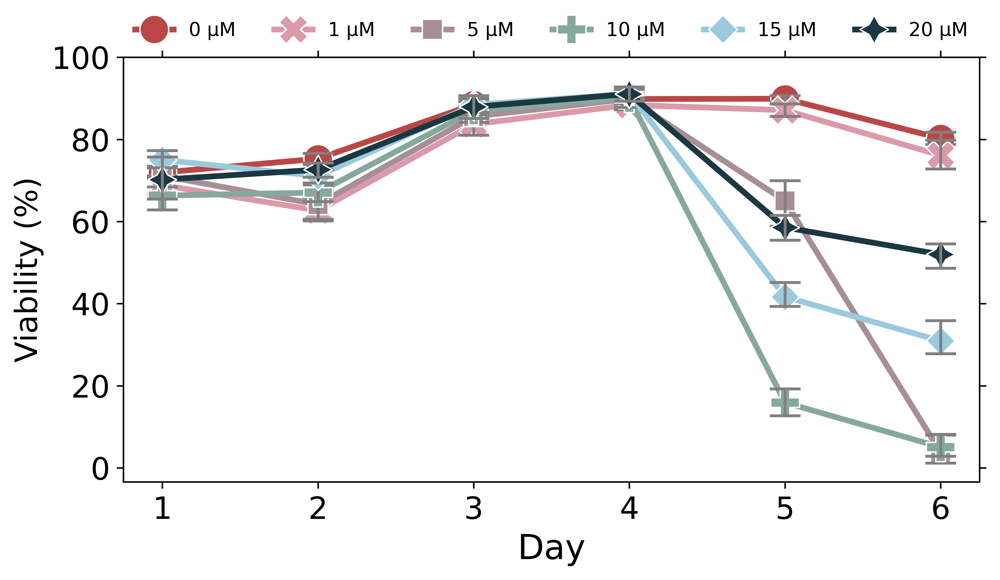

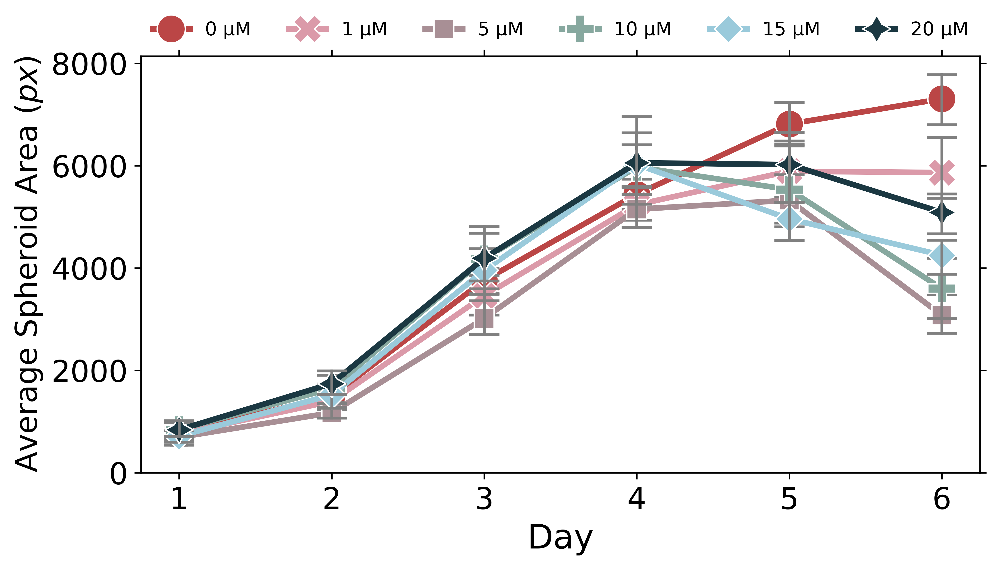

In [17]:
# color palette for the following data
long_cp = ['#BB4646', '#DB9AA9', '#A88F95', '#87A89F', '#9ACADB', '#1B3842']

# plot by viability
# creating the blank figure
fig5 = plt.figure(figsize = (8,4), dpi = 600)

# creating the line plot and specifying arguments for aesthetics
longplot = sns.lineplot(data = long_data, x = 'Day', y = 'avg_viability', markers = True, markersize = 15, linewidth = 3, dashes = False, palette = long_cp, err_style = 'bars', err_kws = dict(ecolor = 'grey', elinewidth = 1.5, capsize = 8, capthick = 1.5), hue = 'gem_conc', style = 'gem_conc')

# further plot aesthetics
longplot.tick_params(top = True, right = True)

# x label things
longplot.set_xlabel('Day', size = '18')
longplot.set_xticks([1, 2, 3, 4, 5, 6])
longplot.set_xticklabels(longplot.get_xticks(), size = '16')

# y label things
longplot.set_yticks(range(0, 110, 20))
longplot.set_yticklabels(longplot.get_yticks(), size = '16')
longplot.set_ylabel('Viability (%)', size = '16')

# legend things
longplot.legend(title = 'Drug Concentration', labels = ['0 µM', '1 µM', '5 µM', '10 µM', '15 µM', '20 µM'])
sns.move_legend(longplot, "lower center", bbox_to_anchor=(.5, 1), ncol = 6, title = None, frameon = False, fontsize = 10)

# plot by average area of orgnaoids
# code organized the same as above
fig51 = plt.figure(figsize = (8,4), dpi = 600)
longplot = sns.lineplot(data = long_data, x = 'Day', y = 'avg_area', markers = True, markersize = 15, linewidth = 3, dashes = False, palette = long_cp, err_style = 'bars', err_kws = dict(ecolor = 'grey', elinewidth = 1.5, capsize = 8, capthick = 1.5), hue = 'gem_conc', style = 'gem_conc')
longplot.tick_params(top = True, right = True)
longplot.set_xlabel('Day', size = '18')
longplot.set_xticks([1, 2, 3, 4, 5, 6])
longplot.set_xticklabels(longplot.get_xticks(), size = '16')
longplot.set_yticks(range(0, 9000, 2000))
longplot.set_yticklabels(longplot.get_yticks(), size = '16')
longplot.set_ylabel('Average Spheroid Area ($px$)', size = '16')
longplot.legend(title = 'Drug Concentration', labels = ['0 µM', '1 µM', '5 µM', '10 µM', '15 µM', '20 µM'])
sns.move_legend(longplot, "lower center", bbox_to_anchor=(0.5, 1), ncol = 6, title = None, frameon = False, fontsize = 10)

# SI

#### Epoch and Validation Loss Plots

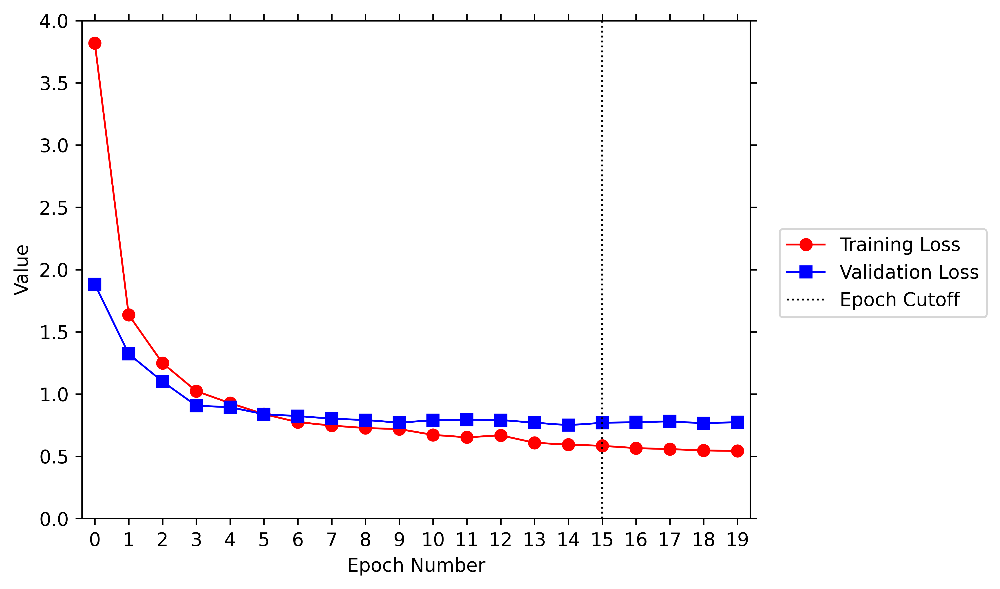

In [ ]:
# reading in data from csvs 
train_loss = pd.read_csv('trainLoss.csv')
val_loss = pd.read_csv('validationLoss.csv')

# establishing SI figure 1, can specify the DPI depending on what export level is needed
sifig2, ax = plt.subplots(dpi = 600) 
ax.plot(train_loss['Step'], train_loss['Value'], color = 'red', label = 'Training Loss', marker = 'o', linewidth = 1 ) 
ax.plot(val_loss['Step'], val_loss['Value'], color = 'blue', label = 'Validation Loss', marker = 's', linewidth = 1)

# setting up the figure parameters
plt.xlabel('Epoch Number') 
plt.ylabel('Value')
ax.tick_params(right = True, top = True) # adding top and right major ticks
ax.set_ylim(0, 4.0)
ax.margins(0.02)
ax.xaxis.set_major_locator(ticker.MultipleLocator(1)); # changing the ticks to be for every 1 integer in the range
ax.axvline(15, color = 'black', linestyle = ':', linewidth = '1', label = 'Epoch Cutoff') # introducing the cutoff line

# creating the legend for the plot
plt.legend(bbox_to_anchor = (1.03, .6)); # setting the location of the legend more specifically than the loc call

#### Expert Color Matching plots and analysis
1. histogram of the two comparisons
2. statistical tests for comparions

In [ ]:
# Plot histograms for expert color matching comparison
xcm1 = pd.read_excel('expert_color_match.xlsx', sheet_name = 'Expert 1') # read in expert 1 color matching data
xcm2 = pd.read_excel('expert_color_match.xlsx', sheet_name = 'Expert 2') # read in expert 2 color mathcing data

# setting custom color palette for exp1 and exp2 while keeping truth values the same color 
xcp1 = ['#277AAD', '#ECC936']
xcp2 = ['#B090D7', '#ECC936']

b = np.arange(0,110,10)
# plot histograms as subplots in the same figure
sifig3, ax = plt.subplots(nrows = 1, ncols = 2, sharey = 'row', figsize = (20,4), dpi = 900)
sns.histplot(data = xcm1, ax = ax[0], fill = True, legend = True, multiple = 'dodge', bins = b, palette = xcp1, edgecolor = 'white', linewidth = 3)
sns.histplot(data = xcm2, ax = ax[1], fill = True, legend = True, multiple='dodge', bins = b, palette = xcp2, edgecolor = 'white', linewidth = 3)

for i in range(2):
    ax[i].set(xlabel = 'Percent White')

for i in range(2):
    ax[i].margins(x=0.01)

plt.subplots_adjust(top = 0.85, wspace = 0.05) 
plt.ylim(0, 14) # changed the y axis scale to keep legend position consistent within each plot
tick_bin_text(b, 90, 100) # changing the names of the bin ticks according to the bins

#### SAAVY vs. CTG Histogram of all Data 

**D6 only** \
a) all data \
b) clear background \
c) noisy background

In [ ]:
# creating the figure and layout specifications
fig9 = plt.figure(figsize = (16,10), dpi = 900) 
grid = plt.GridSpec(3, 4, wspace = 0.3, hspace = 0.6)
plt.subplots_adjust(top = .93)

# setting the color palette for the data 
data_cp = ['#BB4646', '#044B53'] 

# adding subplots
g1 = fig9.add_subplot(grid[0, :4]) 
g2 = fig9.add_subplot(grid[1, :4])
g3 = fig9.add_subplot(grid[2, :4])

# lists for what I am calling to make the figure in a loop
plot_list = [g1, g2, g3]
data_list = [d6, d6_clear, d6_noisy]

for sub in range(3):

    sns.histplot(data = data_list[sub].iloc[:, d6.columns.get_loc('SAAVY'):d6.columns.get_loc('CTG') + 1], ax = plot_list[sub], fill = True, multiple = 'dodge', legend = True, bins = b_hi, edgecolor = 'white', linewidth = 3, palette = data_cp) 

    # storing names for the x axis
    fig9_names = ['N\D']
    for i, value in enumerate(b_hi[:-3]):
        fig9_names.append('{:.0f}%\nto\n{:.0f}%'.format(b_hi[i+1], b_hi[i+2]-1)) 
    fig9_names.append('210%\nto\n220%')

    # setting the aesthetics of the plot
    plot_list[sub].tick_params(top = True, right = True, labelsize = 8)  
    plot_list[sub].margins(x = 0.01)
    plot_list[sub].set_xticks([(b_hi[i+1] + value)/2 for i, value in enumerate(b_hi[:-1])]) 
    plot_list[sub].set_xticklabels(fig9_names, size = 12)
    plot_list[sub].set_xlabel('Percent Viable', size = 16)
    plot_list[sub].set_yticks(np.arange(0,60,10))
    plot_list[sub].set_ylabel('Count', size = 16)
    plot_list[sub].yaxis.set_major_locator(ticker.MultipleLocator(10))
    sns.move_legend(plot_list[sub], 'upper right', fontsize = '16')

plt.savefig('ctg_histogram.png', bbox_inches='tight')

In [ ]:
# Compute the statistical significance between exp1 and truth and exp2 and truth

# from the histograms above we can see that the data is not normal -- confirm with a stats test
for i in range(2):
    stat, p = shapiro(xcm1.iloc[:,i])
    print('Shapiro p-value = ', p)
    stat, p = shapiro(xcm2.iloc[:,i])
    print('Shapiro p-value = ', p)

'''
want to do a non parametric t-test for these (55 samples for expert 1, 19 for expert 2)
the samples between expert and ground truth are paired 
non parametric analysis test if the two samples came from the same distribution (null) or not (alternate)
and will ignore differences of 0 (only 4 for expert 1 and 2 for expert 2)
'''

exp1_exp2_list = [[], []]
data = [xcm1, xcm2]
cols = ['Expert 1', 'Truth', 'Expert 2']
inputs = ['Expert vs. Truth', 'Expert 1', 'Expert 2', 'expert_colormatch_jsd.png']
jsd_calc(exp1_exp2_list, data, cols, inputs, bins = b)

stat, p = wilcoxon(xcm1.iloc[:,0], xcm1.iloc[:,1]) 
print('wilcoxon p-value =', p) 
stat, p = wilcoxon(xcm2.iloc[:,0], xcm2.iloc[:,1])
print('wilcoxon p-value =', p) 

Shapiro p-value =  0.0004893605946563184
Shapiro p-value =  0.041108690202236176
Shapiro p-value =  0.009938017465174198
Shapiro p-value =  0.38213294744491577
wilcoxon p-value = 2.8871510540896417e-07
wilcoxon p-value = 0.006475006056222027


/Users/ktrettner/anaconda3/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


#### Expert only histograms of the data breakdown between all, clear, and noisy backgrounds

In [ ]:
# initializing the figure and subset specifications
sifig4 = plt.figure(figsize = (14,8), dpi = 900)
grid = plt.GridSpec(2, 4, wspace = 0.5, hspace = 0.6)
plt.subplots_adjust(top = .93)

# setting the color palette 
data_cp = ['#277AAD', '#B090D7'] 

# assigning sections of the grid to the various subplots
g1 = sifig4.add_subplot(grid[0, :4]) 
g2 = sifig4.add_subplot(grid[1, :2])
g3 = sifig4.add_subplot(grid[1, 2:])
subplot_list = [g1, g2, g3]

# collating the data so I can call/plot in a loop
data_list = [mappings_data, data_clear, data_noisy]

for sub in range(len(subplot_list)):
    sns.histplot(data = data_list[sub].iloc[:, mappings_data.columns.get_loc('Expert 1'):mappings_data.columns.get_loc('Expert 2') + 1], ax = subplot_list[sub], fill = True, multiple = 'dodge', legend = True, bins = b, edgecolor = 'white', palette = data_cp, linewidth = 2)

    # changing the names of the x-axis
    sifig4_names = ['N\D'] # making a list to store all of the names
    for i, value in enumerate(b[:-3]): 
        sifig4_names.append('{:.0f}%\nto\n{:.0f}%'.format(b[i+1], b[i+2]-1)) 
    sifig4_names.append('90%\nto\n100%')

    subplot_list[sub].set_xticklabels(sifig4_names, size = 12)
    subplot_list[sub].tick_params(top = True, right = True, labelsize = 12)
    subplot_list[sub].margins(x = 0.01)
    subplot_list[sub].set_xticks([(b[i+1] + value)/2 for i, value in enumerate(b[:-1])]) 
    subplot_list[sub].set_xlabel('Percent Viable', size = 16)
    subplot_list[sub].set_ylabel('Count', size = 16)
    sns.move_legend(subplot_list[sub], 'upper right', fontsize = '16')

    # setting some specifics here too
    g1.set_yticks(np.arange(0,180,20))
    g2.set_yticks(np.arange(0,110,10))
    g3.set_yticks(np.arange(0,110,10))

/var/folders/qs/d473v6y53jq0xy5g3j1ts0p80000gp/T/ipykernel_42312/3124797997.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  subplot_list[sub].set_xticklabels(sifig4_names, size = 12)
/var/folders/qs/d473v6y53jq0xy5g3j1ts0p80000gp/T/ipykernel_42312/3124797997.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  subplot_list[sub].set_xticklabels(sifig4_names, size = 12)
/var/folders/qs/d473v6y53jq0xy5g3j1ts0p80000gp/T/ipykernel_42312/3124797997.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  subplot_list[sub].set_xticklabels(sifig4_names, size = 12)


#### Incremental estimation plot - SI Fig5

In [ ]:
# setting up the figure space
sifig5 = plt.figure(figsize = (18,10), dpi = 900)
grid = plt.GridSpec(3, 5, wspace = 0.3, hspace = 0.2)
plt.subplots_adjust(top = .93)

# adding subplots to the figure space
g1 = sifig5.add_subplot(grid[0, :])
g2 = sifig5.add_subplot(grid[1, :])
g3 = sifig5.add_subplot(grid[2, :])
subplot_list = [g1, g2, g3]

# changing the binning to go by 1
b_1 = np.arange(0,102,1)

# creating a new data subset to select only the positive viabilities reported
pos_data = mappings_data[mappings_data.iloc[:, mappings_data.columns.get_loc('Expert 1'):mappings_data.columns.get_loc('SAAVY') + 1] >= 0]

# creating the plots
sns.histplot(data = pos_data['Expert 1'], ax = g1, fill = True, multiple = 'dodge', bins = b_1, edgecolor = 'white', color = '#277AAD', linewidth = 2) 
sns.histplot(data = pos_data['Expert 2'], ax = g2, fill = True, multiple = 'dodge', bins = b_1, edgecolor = 'white', color = '#B090D7', linewidth = 2) 
sns.histplot(data = pos_data['SAAVY'], ax = g3, fill = True, multiple = 'dodge', bins = b_1, edgecolor = 'white', color = '#BB4646', linewidth = 2)

for sub in range(len(subplot_list)):
    subplot_list[sub].tick_params(axis = 'x', which = 'minor', top = True, right = True, labelsize = 8) # adding the ticks and the label sizing for this plot 
    subplot_list[sub].margins(x = 0.005) # adjusted the margins on the side of the plot to be smaller
    subplot_list[sub].xaxis.set_major_locator(ticker.MultipleLocator(10))
    subplot_list[sub].xaxis.set_minor_locator(ticker.MultipleLocator(1))
    # old commands if I want to label every point
    # subplot_list[sub].set_xticks([(b_1[i+1] + value)/2 for i, value in enumerate(b_1[:-1])])
    # subplot_list[sub].set_xticklabels(['{:.0f}'.format(value, b_1[i+1]) for i, value in enumerate(b_1[:-1])], size = 'small')
    subplot_list[2].set_xlabel('Percent Viable')

#### Correlative Heatmap between Experts and SAAVY

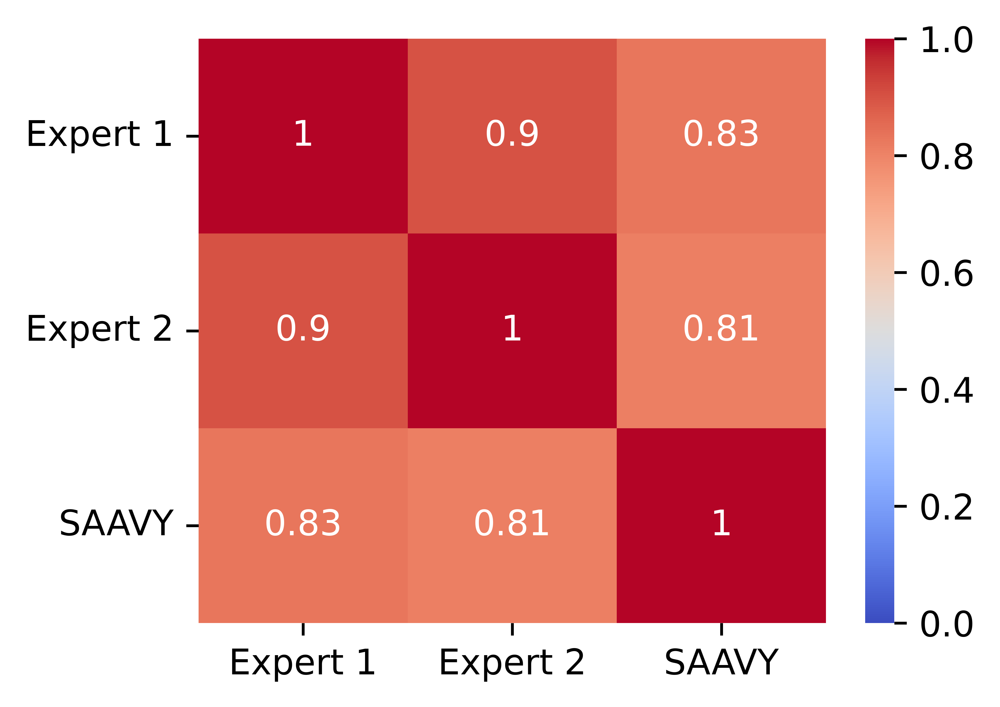

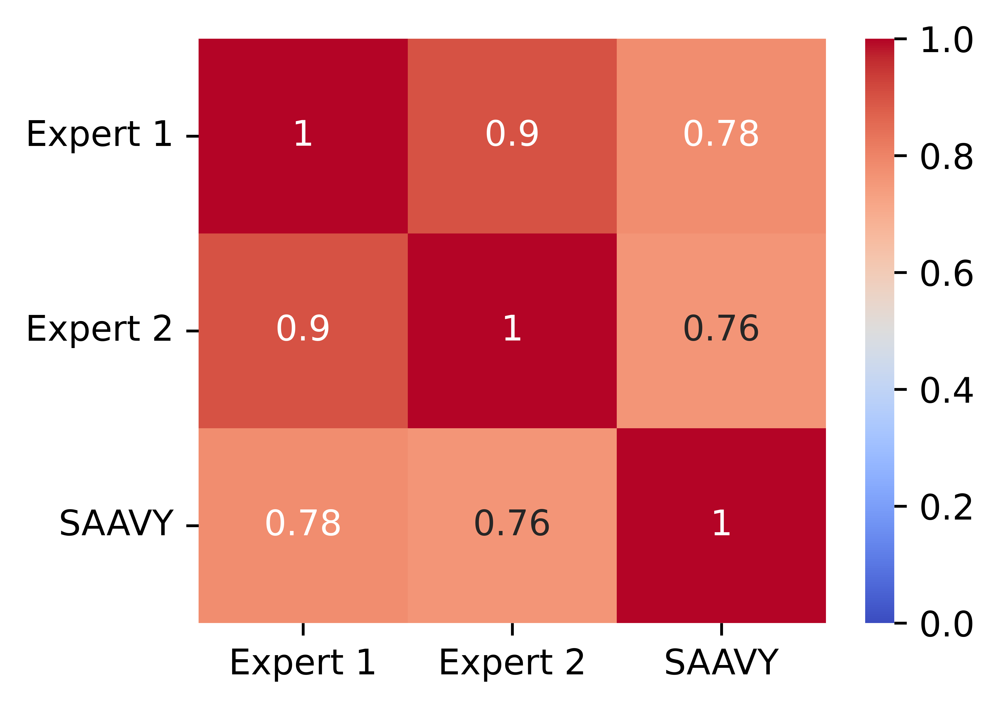

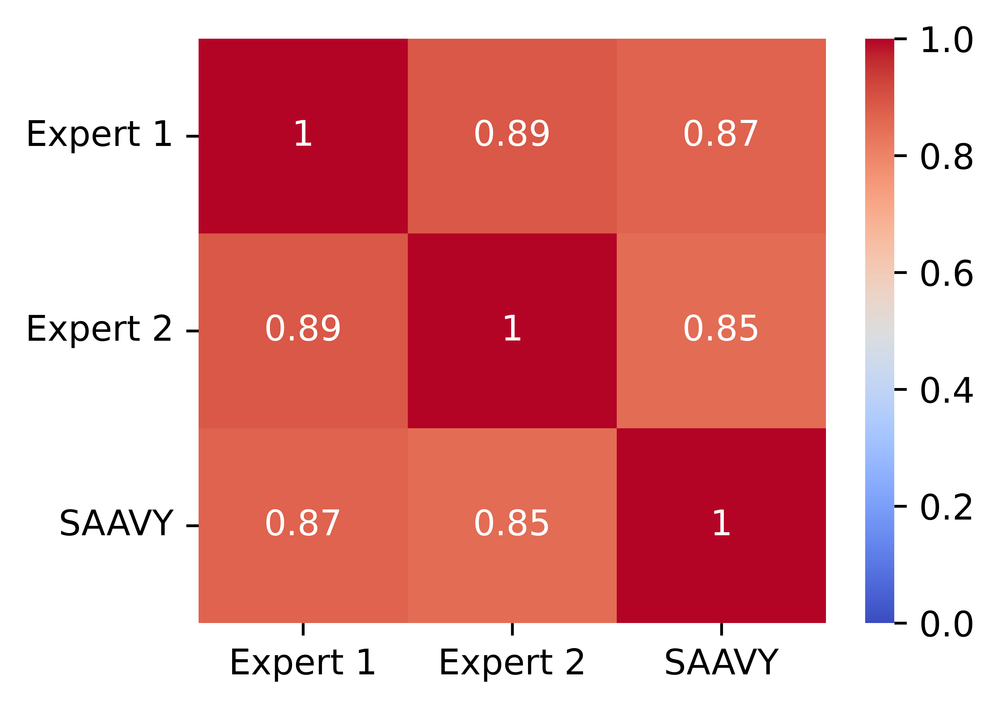

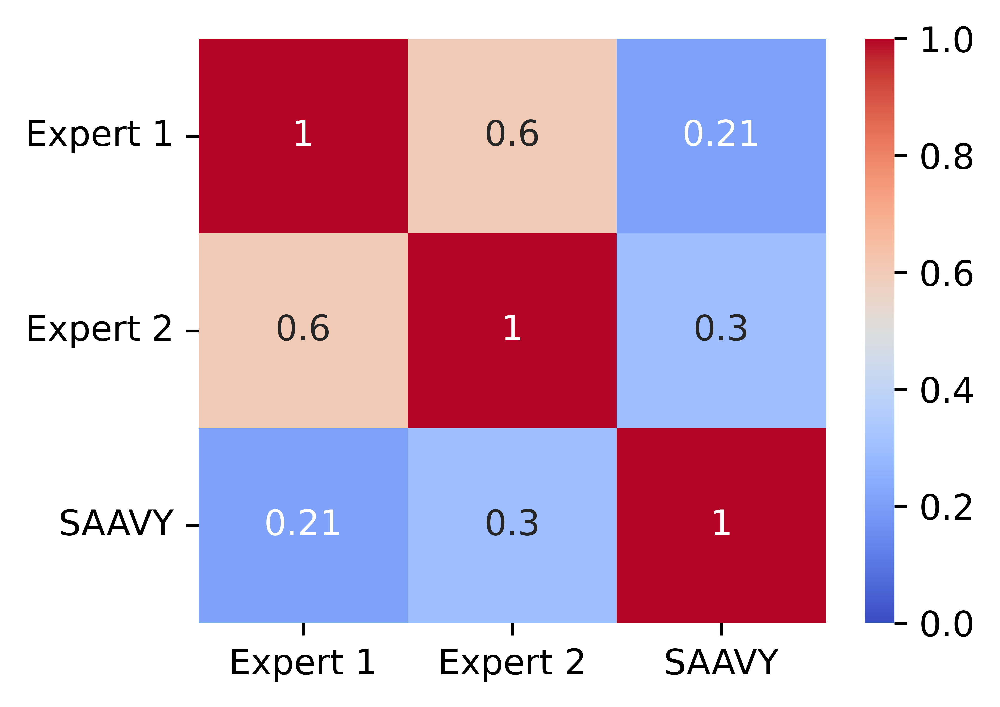

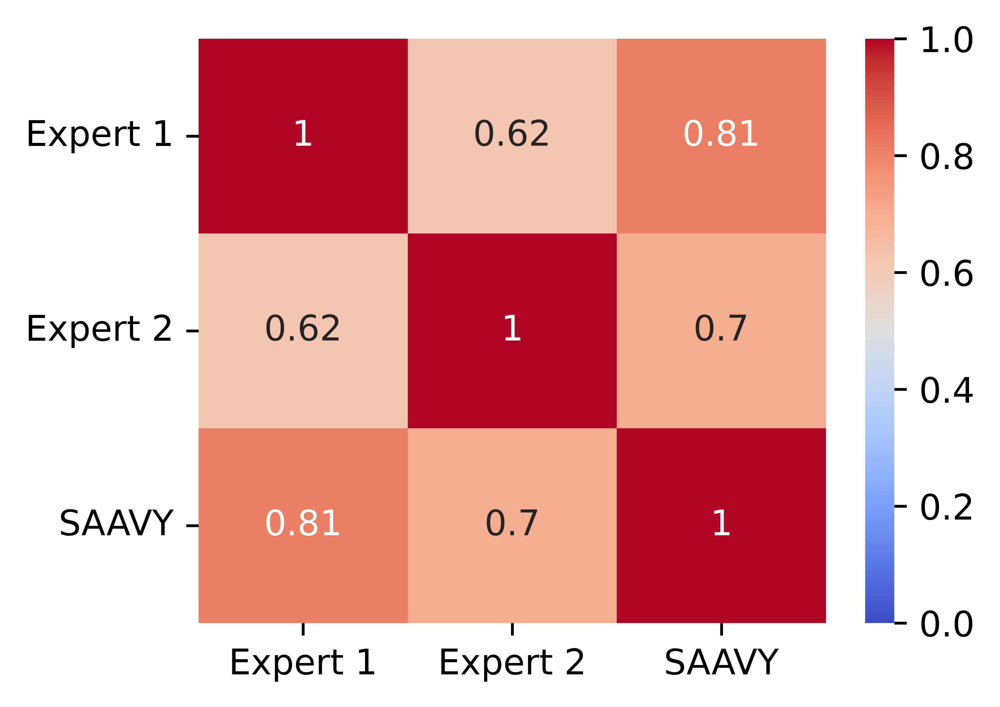

...

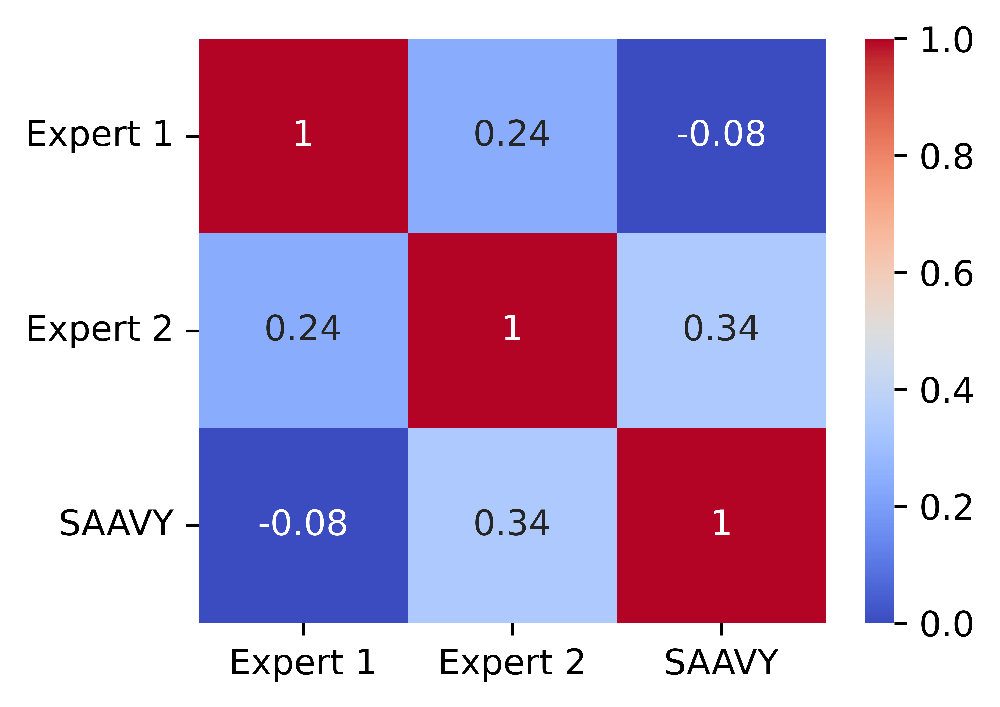

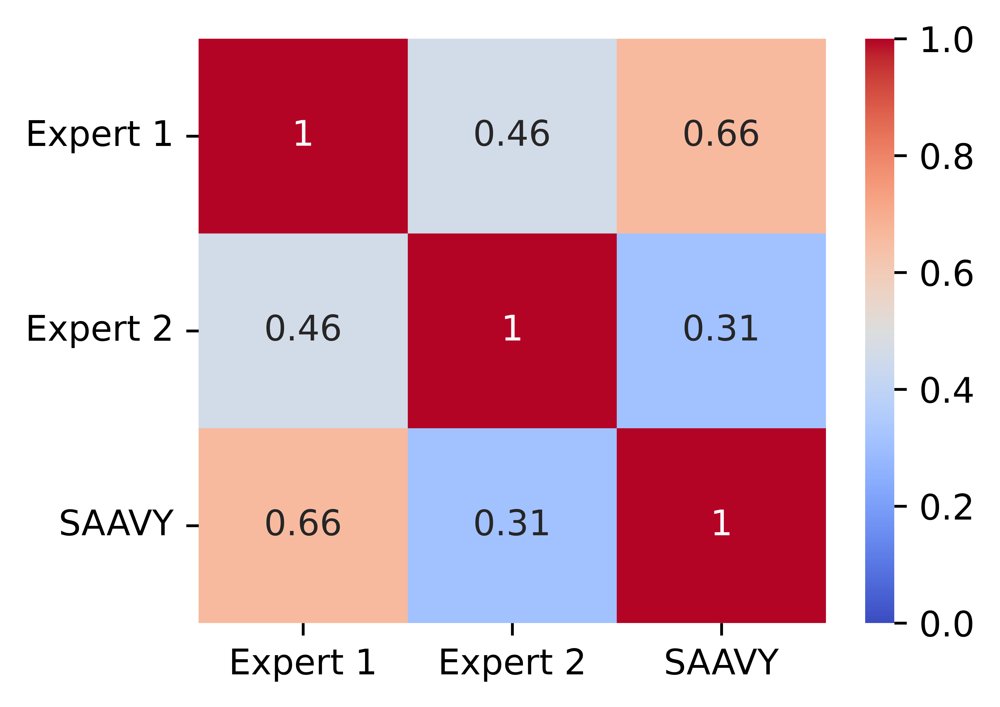

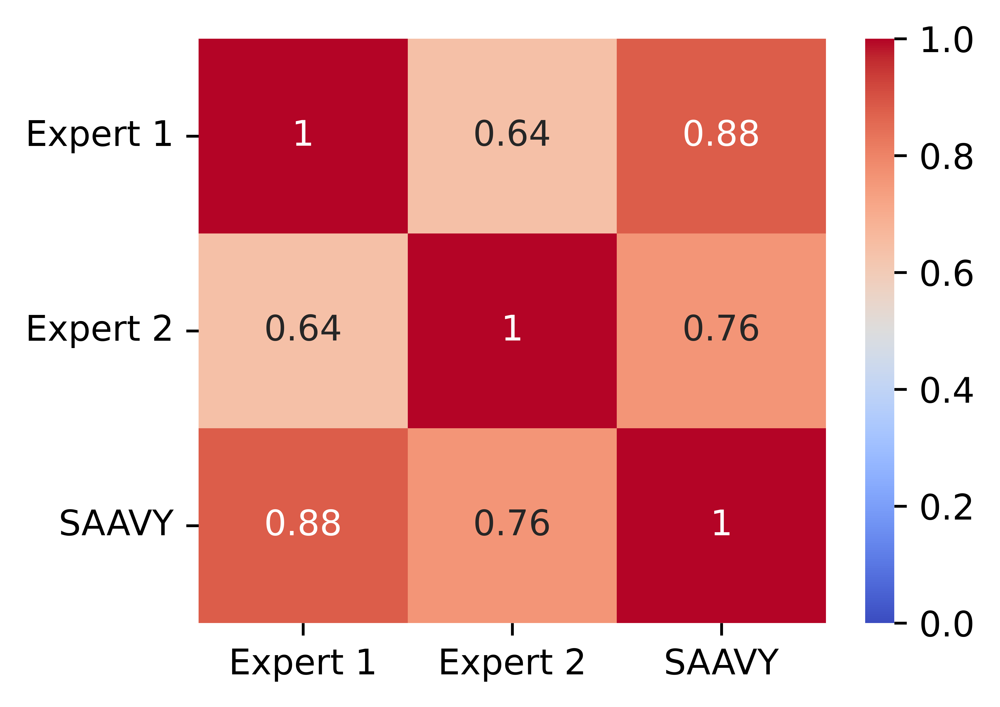

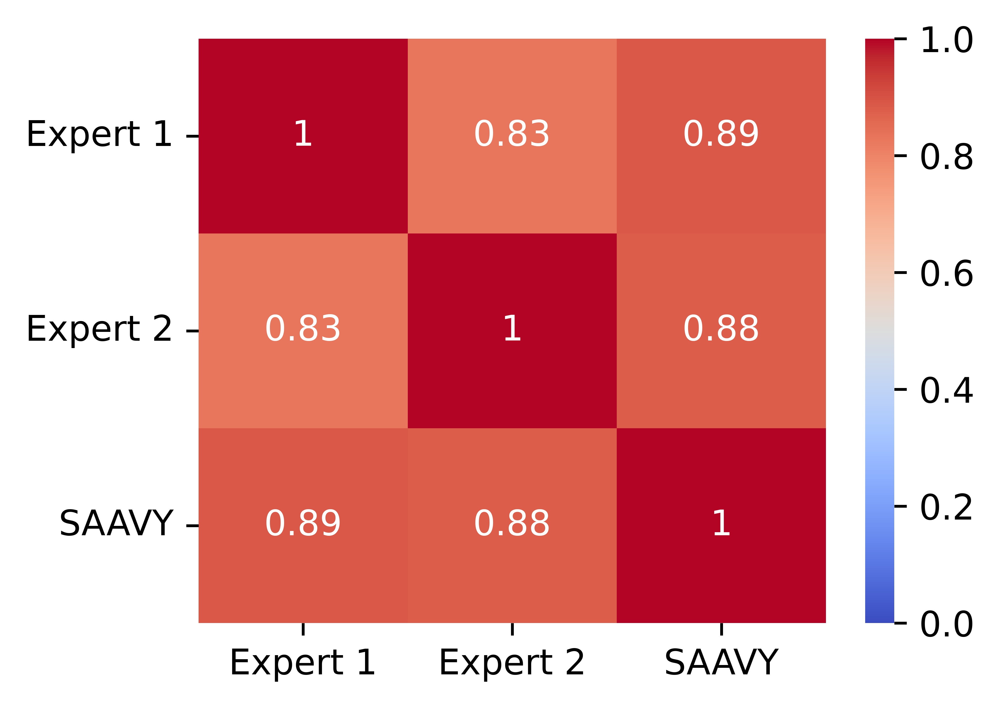

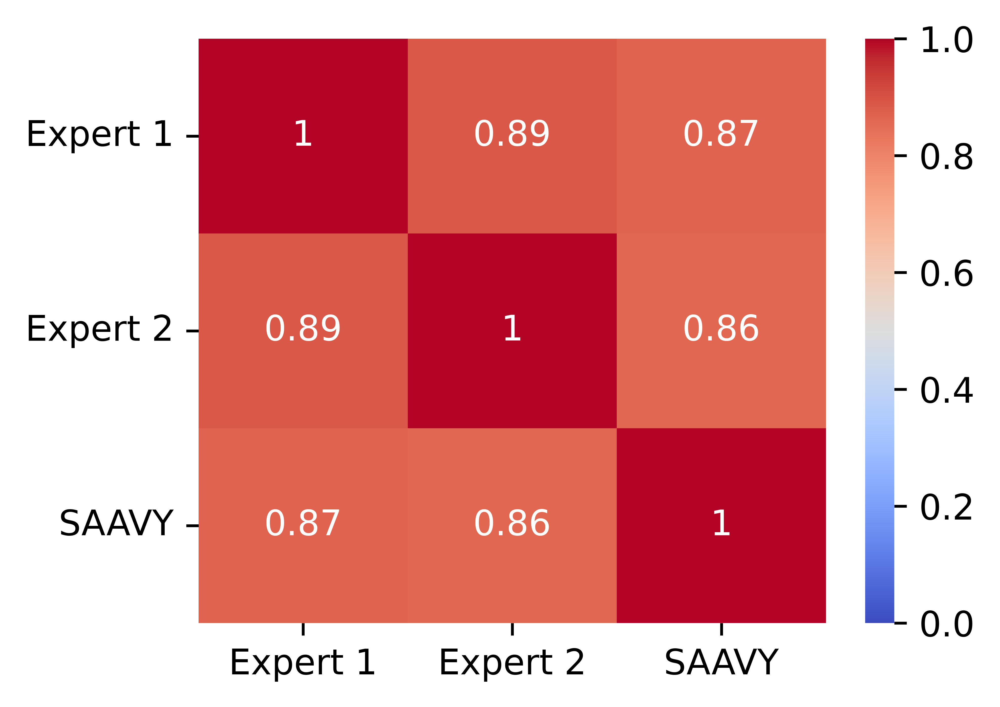

In [ ]:
# mappings data, day (individual) data, day + background data, background data
# comparing Expert 1, Expert 2, SAAVY

hp_data = [mappings_data, data_clear, data_noisy, d0, d4, d6, d0_clear, d0_noisy, d4_clear, d4_noisy, d6_clear, d6_noisy]
hp_data_desc = ['Overall', 'Clear', 'Noisy', 'D0', 'D4', 'D6', 'D0 Clear', 'D0 Noisy', 'D4 Clear', 'D4 Noisy', 'D6 Clear', 'D6 Noisy']
make_hp(hp_data, hp_data_desc, 'Expert 1', 'SAAVY')

#### Plotting Figure SI-7 - the main comparisons of all data subsets

In [ ]:
# initializing the figure and figure specifications
fig4 = plt.figure(figsize = (24,8), dpi = 900) 
grid = plt.GridSpec(2, 3, wspace = 0.15, hspace = 0.4)
plt.subplots_adjust(top = .93)
g1 = fig4.add_subplot(grid[:1, :1])
g2 = fig4.add_subplot(grid[1:, :1])
g3 = fig4.add_subplot(grid[:1, 1:2])
g4 = fig4.add_subplot(grid[1:, 1:2])
g5 = fig4.add_subplot(grid[:1, 2:])
g6 = fig4.add_subplot(grid[1:, 2:])

# setting the color palette for the plots
data_cp = ['#277AAD', '#B090D7','#BB4646']

# plotting and filling in the various subplots
plot_list = [g1, g2, g3, g4, g5, g6]
data_list = [d0_clear, d0_noisy, d4_clear, d4_noisy, d6_clear, d6_noisy]

# plotting the subplots in a loop on the main figure
for sub in range(len(plot_list)):

    sns.histplot(data = data_list[sub].iloc[:, mappings_data.columns.get_loc('Expert 1'):mappings_data.columns.get_loc('CTG')], ax = plot_list[sub], fill = True, multiple = 'dodge', legend = True, bins = b, edgecolor = "white", linewidth = 2, palette = data_cp)
    plot_list[sub].tick_params(top = True, right = True)
    plot_list[sub].margins(x = 0.01) # adjusted the margins on the side of the plot to be smaller
    plot_list[sub].set_xticks([(b[i+1] + value)/2 for i, value in enumerate(b[:-1])]) 
    
    fig4_names = ['N/D'] # making a list to store all of the names
    for i, value in enumerate(b[:-3]): 
        fig4_names.append('{:.0f}%\nto\n{:.0f}%'.format(b[i+1], b[i+2]-1))
        
        '''
        The loop should go through all of the number of bins except for the first one, since I want to change that label, and the last one, since we need n-1 bins 
        
        Adding the name of the bin in 10% to 20% format and iterate from i+1 (since we want to start at 0 not -10) to i+2 to the name list that begins with None Detected
        '''
    fig4_names.append('90%\nto\n100%')

    plot_list[sub].set_xticklabels(fig4_names, fontsize = '13')
    plot_list[sub].set_yticks(np.arange(0,80,10))
    plot_list[sub].set_yticklabels(g1.get_yticks(), size = '13', rotation = 90)
    plot_list[sub].set_ylabel('Count', size = '16')
    plt.setp(plot_list[sub].get_legend().get_texts(), fontsize = '12')
    sns.move_legend(plot_list[sub], 'upper right', fontsize = '12')

plt.savefig('main_histogram.png', bbox_inches='tight')

#### Distance Metrics comparison for data distribution subsets
1. Jensen Shannon Distance
2. KL divergence
3. Earth mover's distance (using wasserstein metric)
4. Krippendorff's alpha
5. Population Stability Index

In [ ]:
datasets = [d0_clear, d0_noisy, d4_clear, d4_noisy, d6_clear, d6_noisy]

# discretizing all of the data of interest to analyze
disc_data = [[], [], [], [], [], []]
for subset in range(len(datasets)):
    for i in np.arange(d0_clear.columns.get_loc('Expert 1'), d0_clear.columns.get_loc('SAAVY')+1, 1):
        disc_data[subset].append(np.histogram(datasets[subset].iloc[:,i], bins = b)[0]/len(datasets[subset].iloc[:,i]))

k_data = []
for subset in range(len(datasets)):
    k_data.append([pd.pivot_table(datasets[subset].loc[:, ['file', 'Expert 1', 'SAAVY']], columns = 'file').round(0), pd.pivot_table(datasets[subset].loc[:, ['file', 'Expert 2', 'SAAVY']], columns = 'file').round(0)])

psi_data = []
for subset in range(len(datasets)):
    psi_data.append([datasets[subset].loc[:,['Expert 1', 'SAAVY']], datasets[subset].loc[:,['Expert 2', 'SAAVY']]])

file_names = ['D0 Clear Statistical Methods Comparison.png', 'D0 Noisy Statistical Methods Comparison.png', 'D4 Clear Statistical Methods Comparison.png', 'D4 Noisy Statistical Methods Comparison.png', 'D6 Clear Statistical Methods Comparison.png', 'D6 Noisy Statistical Methods Comparison.png']

# calculating and formating in dataframe for export to table for further review
for subset in range(6):
        comp_method_df = pd.DataFrame({
            'JSD': (sp.spatial.distance.jensenshannon(disc_data[subset][i], disc_data[subset][2]) for i in range(2)),
            'KL Divergence': (sum(sp.special.rel_entr(disc_data[subset][i], disc_data[subset][2])) for i in range(2)),
            'EMD': (sp.stats.wasserstein_distance(disc_data[subset][i], disc_data[subset][2]) for i in range(2)),
            'K-alpha': (krippendorff.alpha(k_data[subset][i], level_of_measurement = 'interval') for i in range(2)),
            'PSI': (calculate_psi(psi_data[subset][i].iloc[:,0], psi_data[subset][i].iloc[:,1]) for i in range(2))
        },
        index = ['Expert 1 v. SAAVY', 'Expert 2 v. SAAVY'])
        dfi.export(comp_method_df, file_names[subset])

/var/folders/qs/d473v6y53jq0xy5g3j1ts0p80000gp/T/ipykernel_65824/3520912538.py:63: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))
/var/folders/qs/d473v6y53jq0xy5g3j1ts0p80000gp/T/ipykernel_65824/3520912538.py:63: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_value = np.sum(sub_psi(expected_percents[i], actual_percents[i]) for i in range(0, len(expected_percents)))
/var/folders/qs/d473v6y53jq0xy5g3j1ts0p80000gp/T/ipykernel_65824/3520912538.py:63: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum bui